# Vehicle Detection and Tracking

In [1]:
import numpy as np
import cv2
import glob
import random
import time
from random import shuffle
from skimage.feature import hog
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.svm import LinearSVC
from sklearn import tree
from sklearn.metrics import accuracy_score
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
import math
from skimage import exposure
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
from moviepy.editor import VideoFileClip
from IPython.display import HTML
random.seed(23)

### Load Data

In [2]:
img_car = glob.glob("vehicles/vehicles/*/*.*")
img_noCar = glob.glob("non-vehicles/non-vehicles/*/*.*")


In [3]:
imgCars =  []

for i in range(len(img_car)):
    imgCars.append(cv2.imread(img_car[i]))


In [4]:
imgNoCars =  []

for i in range(len(img_noCar)):
    imgNoCars.append(cv2.imread(img_noCar[i]))

### Details of data

In [5]:
print ('Car Data: ')
print ('total Car images',len(imgCars))
print ('Car images size', imgCars[random.randint(1, len(imgCars))].shape)
print ('Car images data type', imgCars[random.randint(1, len(imgCars))].dtype)
print ('\nNon Car Data: ')
print ('total non car images',len(imgNoCars))
print ('Non car images size', imgNoCars[random.randint(1, len(imgNoCars))].shape)
print ('Non car images data type', imgNoCars[random.randint(1, len(imgNoCars))].dtype)



Car Data: 
total Car images 8814
Car images size (64, 64, 3)
Car images data type uint8

Non Car Data: 
total non car images 8984
Non car images size (64, 64, 3)
Non car images data type uint8


In [6]:
#Function to compare 5 images
def compare_images5(img1, img2, img3, img4,img5, text1 = 'img1', text2 = 'img2', text3 = 'img3', text4 = 'img4', text5 = 'img5'):
    f, (ax1, ax2,ax3,ax4, ax5) = plt.subplots(1, 5, figsize=(48, 18))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(text1, fontsize=40)
    ax2.imshow(img2)
    ax2.set_title(text2, fontsize=40)
    ax3.imshow(img3)
    ax3.set_title(text3, fontsize=40)
    ax4.imshow(img4)
    ax4.set_title(text4, fontsize=40)
    ax5.imshow(img5)
    ax5.set_title(text5, fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [7]:
#compare two images
def compare_images(img1, img2, text1 = 'img1', text2 = 'img2'):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(48, 18))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(text1, fontsize=40)
    ax2.imshow(img2)
    ax2.set_title(text2, fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



### Visualizing Car images

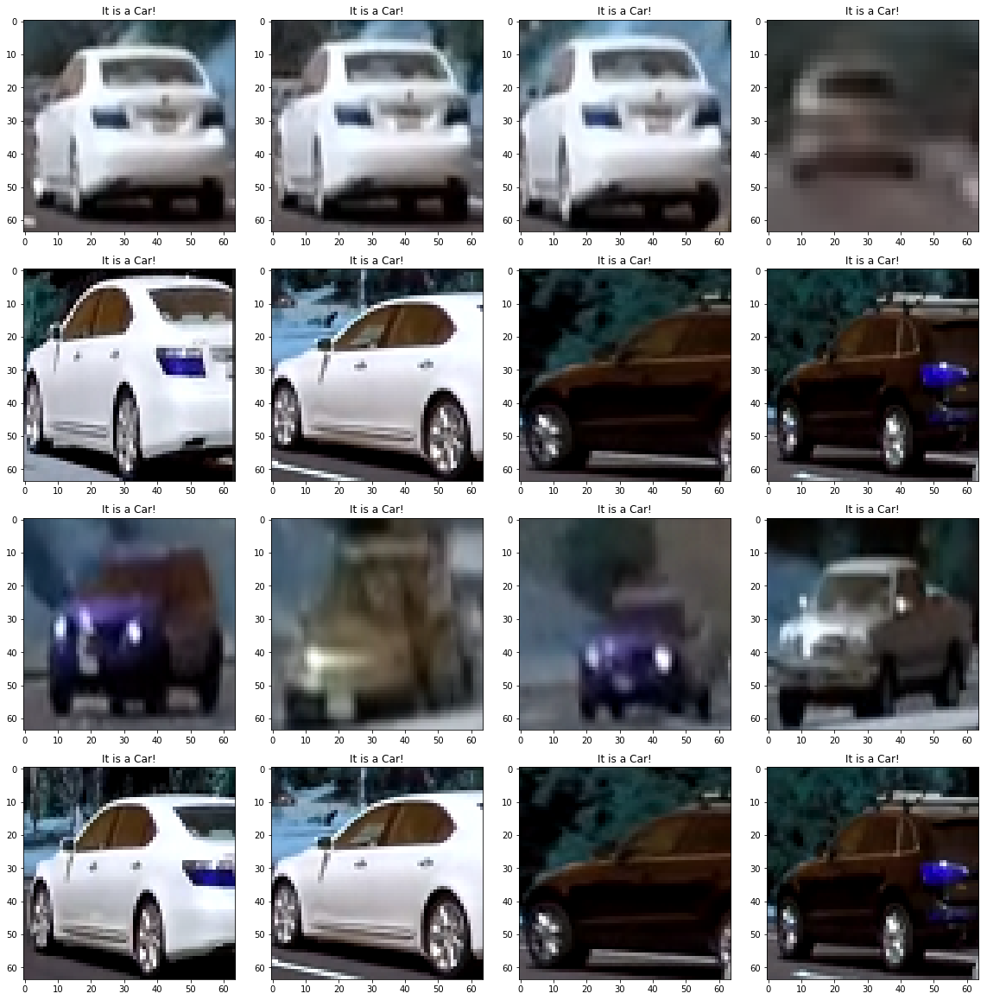

In [8]:
columns = 4
rows = 4
fig=plt.figure(figsize=(16, 16))
img = []
#start of index for randomly displaying images
index = random.randint(1, len(imgCars)- rows*columns)
for i in range(1, columns*rows +1):
    image = imgCars[i]
    fig.add_subplot(columns,rows, i)
    plt.title('It is a Car!')
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    #plt.imshow(perspective_transform(image1))
    plt.imshow(image)
plt.show()


### Visualizing Non Car Images

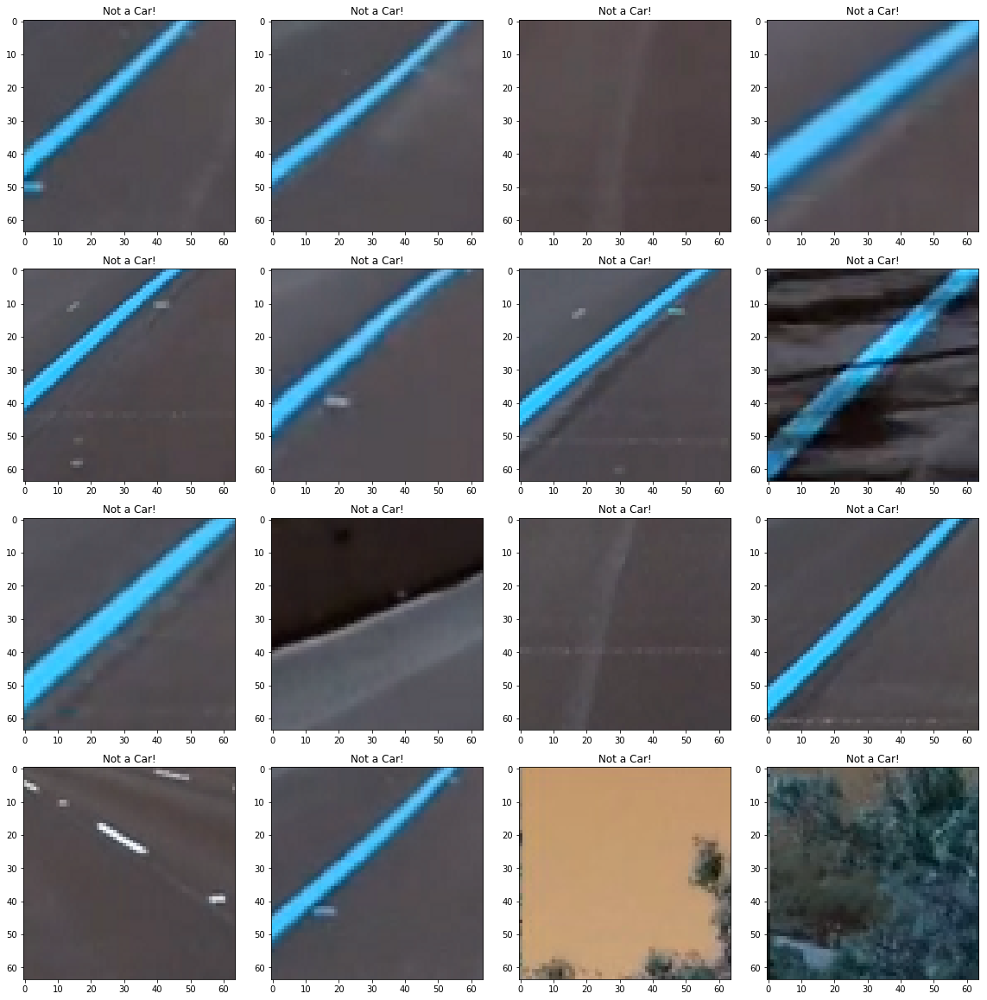

In [9]:
columns = 4
rows = 4
fig=plt.figure(figsize=(16, 16))
img = []
#start of index for randomly displaying images
index = random.randint(1, len(imgNoCars)  - rows*columns)
for i in range(1, columns*rows +1):
    image = imgNoCars[i]
    fig.add_subplot(columns,rows, i)
    plt.title('Not a Car!')
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    #plt.imshow(perspective_transform(image1))
    plt.imshow(image)
plt.show()

In [10]:
#function to convert color space
def convert_color(img, conv='BGR2RGB'):
    #print ('converting ')
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    if conv == 'BGR2LUV':
        return cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
    if conv == 'RGB2YUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    if conv == 'BGR2YUV':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    if conv == 'RGB2HSV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    if conv == 'BGR2HSV':
        return cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    if conv == 'RGB2HLS':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if conv == 'BGR2HLS':
        return cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    if conv == 'BGR2RGB':
        return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:
        return img

#function to get HOG features
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    #print ('get hog: ')
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block),
                                  block_norm= 'L2-Hys',
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block),
                       block_norm= 'L2-Hys',
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features

    #Color features
def bin_spatial(img, size=(32, 32)):
    #print ('binning: ')
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))

#histogram features
def color_hist(img, nbins=32, bins_range=(0, 256), vis = False):
    #print ('histogramming: ')
    # Compute the histogram of the RGB channels separately

    # Take histograms in R, G, and B
    r,g,b = cv2.split(img)
    
    rhist = np.histogram(r, bins = nbins, range=bins_range)[0]
    ghist = np.histogram(g, bins = nbins, range=bins_range)[0]
    bhist = np.histogram(b, bins = nbins, range=bins_range)[0]
    # Generating bin centers
    bin_edges = np.histogram(r, bins = nbins, range=bins_range)[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])//2
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((rhist, ghist, bhist))

    # Return the individual histograms, bin_centers and feature vector
  
    if vis == True:
        
        return rhist, ghist, bhist, bin_centers, hist_features
        
    else:
        return hist_features


### Exploring HOGs with different parameter values 


HOG with orient 9, ppc = 8, cpb = 2, feature size:  1764


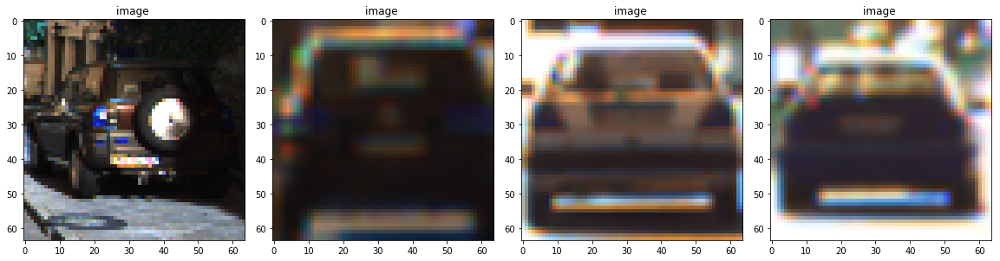

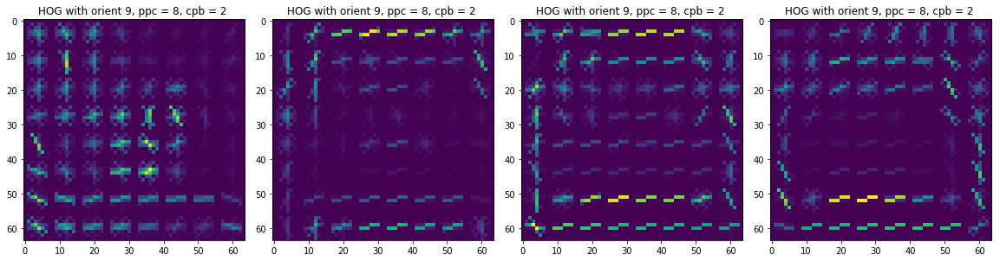


HOG with orient 8, ppc = 8, cpb = 2, feature size:  1568


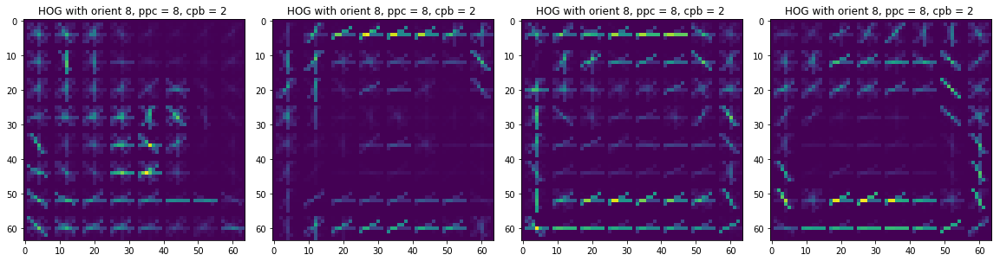


HOG with orient 8, ppc = 8, cpb = 4, feature size:  3200


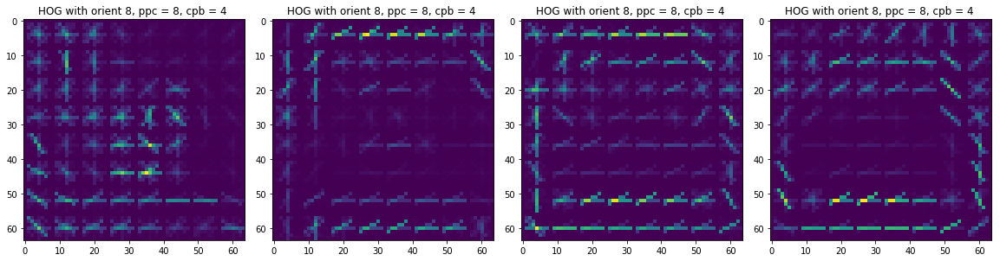


HOG with orient 8, ppc = 4, cpb = 4, feature size:  21632


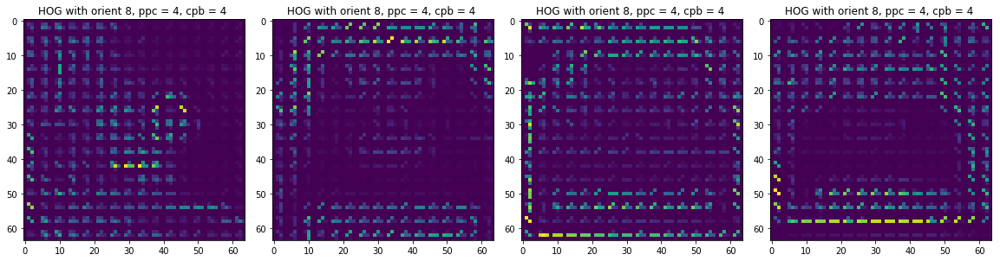


HOG with orient 8, ppc = 4, cpb = 5, feature size:  7200


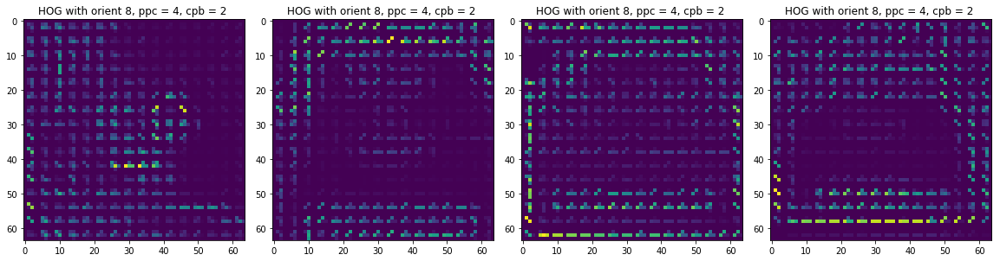


HOG with orient 9, ppc = 4, cpb = 2, feature size:  8100


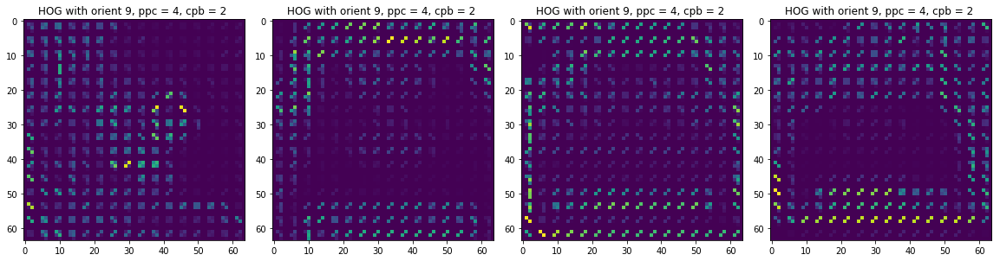


HOG with orient 18, ppc = 8, cpb = 2, feature size:  3528


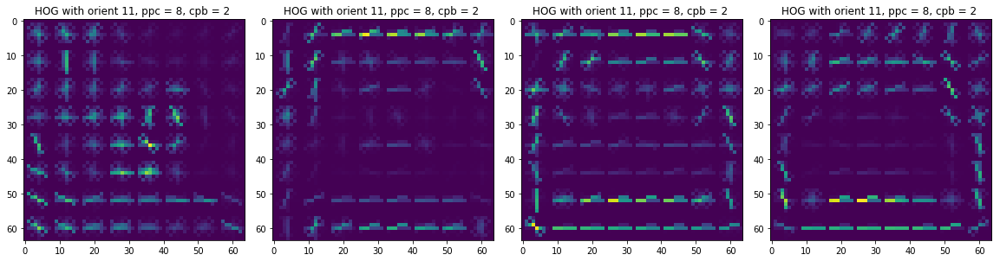

In [11]:

features = []
hog_image = []
imgs = []
num_imgs_to_compare = 5
columns = 4
rows = 1
index = random.randint(1, len(imgCars)  - num_imgs_to_compare)


for i in range(num_imgs_to_compare):
    f, h = get_hog_features(cv2.cvtColor(imgCars[i+index], cv2.COLOR_RGB2GRAY), orient = 9, pix_per_cell = 8, cell_per_block = 2, 
                        vis=True, feature_vec=True)
    imgs.append(imgCars[i+index])
    features.append(f)
    hog_image.append(h)
    

print ('\nHOG with orient 9, ppc = 8, cpb = 2, feature size: ', len(features[0]))
fig=plt.figure(figsize=(16, 16))

#start of index for randomly displaying images
#index = random.randint(1, len(imgNoCars)  - rows*columns)
for i in range(1, columns*rows +1):
    image = imgs[i]
    fig.add_subplot(rows,columns, i)
    plt.title('image ')
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    #plt.imshow(perspective_transform(image1))
    plt.imshow(image)
plt.show()


fig=plt.figure(figsize=(16, 16))


for i in range(1, columns*rows +1):
    image1 = hog_image[i]
    fig.add_subplot(rows,columns, i)
    plt.title('HOG with orient 9, ppc = 8, cpb = 2 ')
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    #plt.imshow(perspective_transform(image1))
    plt.imshow(image1)
plt.show()


features = []
hog_image = []
imgs = []
for i in range(num_imgs_to_compare):
    f, h = get_hog_features(cv2.cvtColor(imgCars[i+index], cv2.COLOR_RGB2GRAY), orient = 8, pix_per_cell = 8, cell_per_block = 2, 
                        vis=True, feature_vec=True)
    imgs.append(imgCars[i+index])
    features.append(f)
    hog_image.append(h)

print ('\nHOG with orient 8, ppc = 8, cpb = 2, feature size: ', len(features[0]))
fig=plt.figure(figsize=(16, 16))

for i in range(1, columns*rows +1):
    image1 = hog_image[i]
    fig.add_subplot(rows,columns, i)
    plt.title('HOG with orient 8, ppc = 8, cpb = 2 ')
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    #plt.imshow(perspective_transform(image1))
    plt.imshow(image1)
plt.show()

features = []
hog_image = []
imgs = []
for i in range(num_imgs_to_compare):
    f, h = get_hog_features(cv2.cvtColor(imgCars[i+index], cv2.COLOR_RGB2GRAY), orient = 8, pix_per_cell = 8, cell_per_block = 4, 
                        vis=True, feature_vec=True)
    imgs.append(imgCars[i+index])
    features.append(f)
    hog_image.append(h)
print ('\nHOG with orient 8, ppc = 8, cpb = 4, feature size: ', len(features[0]))    
fig=plt.figure(figsize=(16, 16))

for i in range(1, columns*rows +1):
    image1 = hog_image[i]
    fig.add_subplot(rows,columns, i)
    plt.title('HOG with orient 8, ppc = 8, cpb = 4 ')
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    #plt.imshow(perspective_transform(image1))
    plt.imshow(image1)
plt.show()


features = []
hog_image = []
imgs = []
for i in range(num_imgs_to_compare):
    f, h = get_hog_features(cv2.cvtColor(imgCars[i+index], cv2.COLOR_RGB2GRAY), orient = 8, pix_per_cell = 4, cell_per_block = 4, 
                        vis=True, feature_vec=True)
    imgs.append(imgCars[i+index])
    features.append(f)
    hog_image.append(h)

print ('\nHOG with orient 8, ppc = 4, cpb = 4, feature size: ', len(features[0])) 
fig=plt.figure(figsize=(16, 16))

for i in range(1, columns*rows +1):
    image1 = hog_image[i]
    fig.add_subplot(rows,columns, i)
    plt.title('HOG with orient 8, ppc = 4, cpb = 4 ')
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    #plt.imshow(perspective_transform(image1))
    plt.imshow(image1)
plt.show()

features = []
hog_image = []
imgs = []
for i in range(num_imgs_to_compare):
    f, h = get_hog_features(cv2.cvtColor(imgCars[i+index], cv2.COLOR_RGB2GRAY), orient = 8, pix_per_cell = 4, cell_per_block = 2, 
                        vis=True, feature_vec=True)
    imgs.append(imgCars[i+index])
    features.append(f)
    hog_image.append(h)
    
fig=plt.figure(figsize=(16, 16))
print ('\nHOG with orient 8, ppc = 4, cpb = 5, feature size: ', len(features[0])) 

for i in range(1, columns*rows +1):
    image1 = hog_image[i]
    fig.add_subplot(rows,columns, i)
    plt.title('HOG with orient 8, ppc = 4, cpb = 2 ')
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    #plt.imshow(perspective_transform(image1))
    plt.imshow(image1)
plt.show()

features = []
hog_image = []
imgs = []
for i in range(num_imgs_to_compare):
    f, h = get_hog_features(cv2.cvtColor(imgCars[i+index], cv2.COLOR_RGB2GRAY), orient = 9, pix_per_cell = 4, cell_per_block = 2, 
                        vis=True, feature_vec=True)
    imgs.append(imgCars[i+index])
    features.append(f)
    hog_image.append(h)
    
fig=plt.figure(figsize=(16, 16))
print ('\nHOG with orient 9, ppc = 4, cpb = 2, feature size: ', len(features[0])) 

for i in range(1, columns*rows +1):
    image1 = hog_image[i]
    fig.add_subplot(rows,columns, i)
    plt.title('HOG with orient 9, ppc = 4, cpb = 2 ')
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    #plt.imshow(perspective_transform(image1))
    plt.imshow(image1)
plt.show()

features = []
hog_image = []
imgs = []
for i in range(num_imgs_to_compare):
    f, h = get_hog_features(cv2.cvtColor(imgCars[i+index], cv2.COLOR_RGB2GRAY), orient = 18, pix_per_cell = 8, cell_per_block = 2, 
                        vis=True, feature_vec=True)
    imgs.append(imgCars[i+index])
    features.append(f)
    hog_image.append(h)
    
fig=plt.figure(figsize=(16, 16))
print ('\nHOG with orient 18, ppc = 8, cpb = 2, feature size: ', len(features[0])) 

for i in range(1, columns*rows +1):
    image1 = hog_image[i]
    fig.add_subplot(rows,columns, i)
    plt.title('HOG with orient 11, ppc = 8, cpb = 2 ')
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    #plt.imshow(perspective_transform(image1))
    plt.imshow(image1)
plt.show()

### Exploring Histograms 

In [12]:

    

def view_hist(img):
    ch1, ch2, ch3, bincen, hist_features = color_hist(img, nbins=32, bins_range=(0, 255), vis=True)

    if ch1 != None:
        fig = plt.figure(figsize=(13,4))
        plt.subplot(141)
        plt.bar(bincen, ch1)
        plt.xlim(0, 256)
        plt.title('channel 1 Histogram')
        plt.subplot(142)
        plt.bar(bincen, ch2)
        plt.xlim(0, 256)
        plt.title('channel 2 Histogram')
        plt.subplot(143)
        plt.bar(bincen, ch3)
        plt.xlim(0, 256)
        plt.title('channel 3 Histogram')
        plt.subplot(144)
        plt.imshow(img)
        #plt.xlim(0, 256)
        plt.title('image')
        fig.tight_layout()



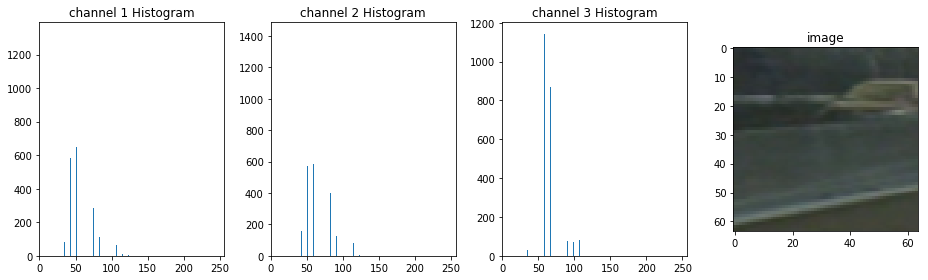

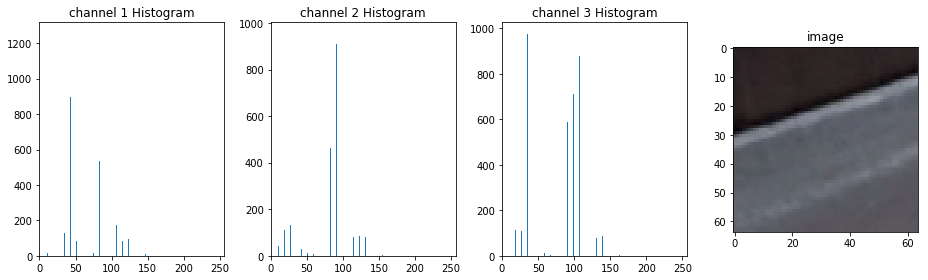

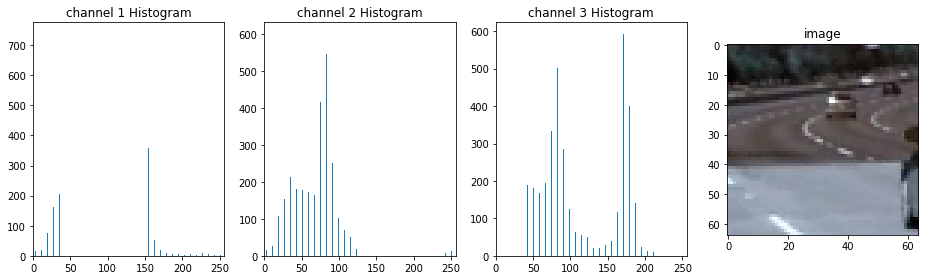

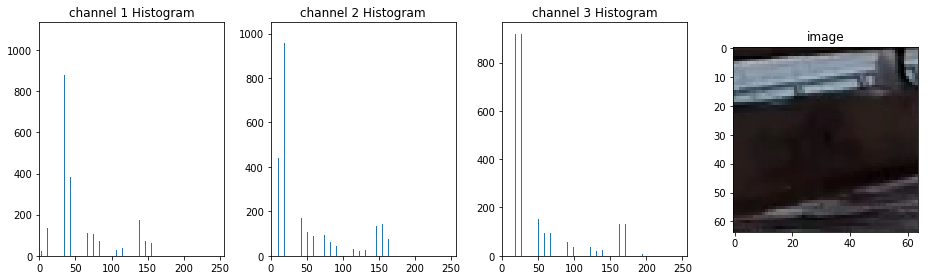

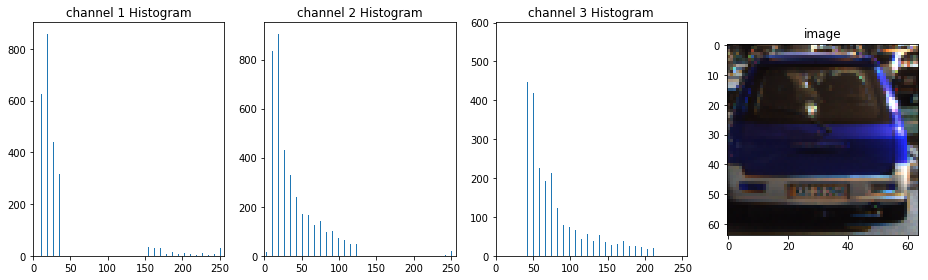

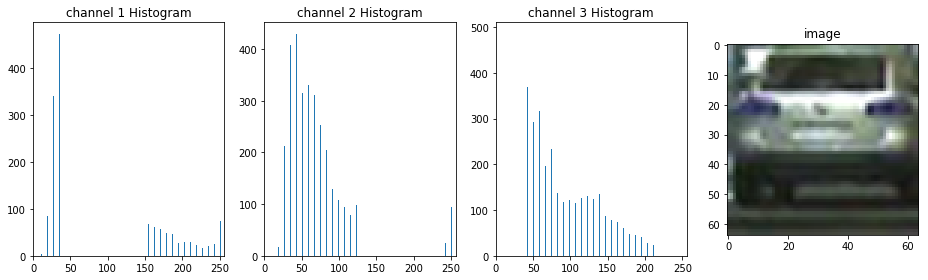

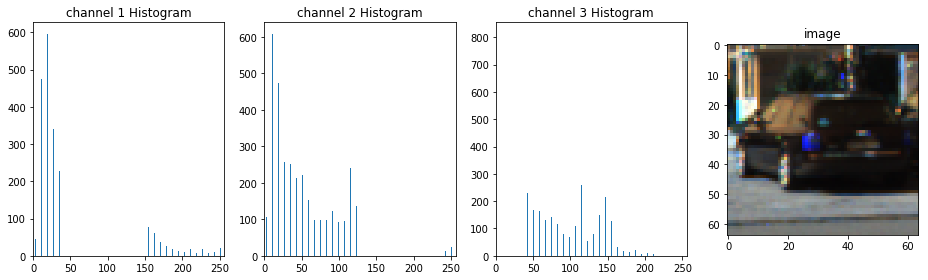

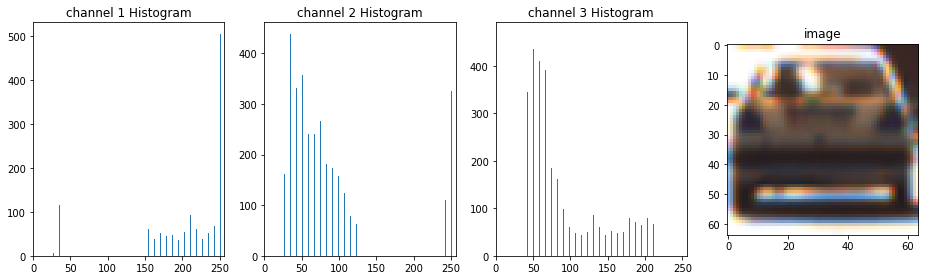

In [13]:
view_hist(imgNoCars[random.randint(1, len(imgNoCars))])
view_hist(imgNoCars[random.randint(1, len(imgNoCars))])
view_hist(imgNoCars[random.randint(1, len(imgNoCars))])
view_hist(imgNoCars[random.randint(1, len(imgNoCars))])

view_hist(imgCars[random.randint(1, len(imgCars))])
view_hist(imgCars[random.randint(1, len(imgCars))])
view_hist(imgCars[random.randint(1, len(imgCars))])
view_hist(imgCars[random.randint(1, len(imgCars))])

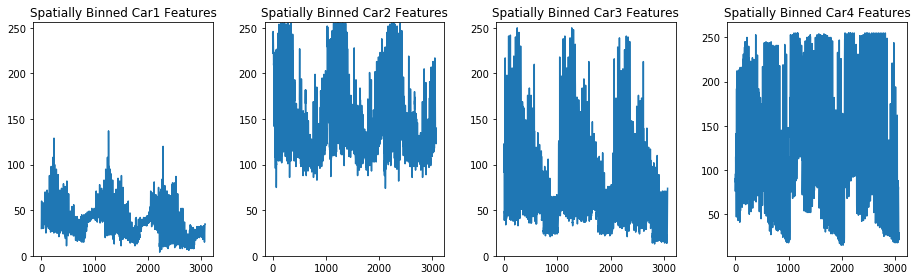

In [14]:
fig = plt.figure(figsize=(13,4))
plt.subplot(141)
plt.plot(bin_spatial(imgCars[random.randint(1, len(imgCars))]))
plt.title('Spatially Binned Car1 Features')
plt.ylim(0, 256)
plt.subplot(142)
plt.plot(bin_spatial(imgCars[random.randint(1, len(imgCars))]))
plt.title('Spatially Binned Car2 Features')
plt.ylim(0, 256)
plt.subplot(143)
plt.plot(bin_spatial(imgCars[random.randint(1, len(imgCars))]))
plt.title('Spatially Binned Car3 Features')
plt.ylim(0, 256)
plt.subplot(144)
plt.plot(bin_spatial(imgCars[random.randint(1, len(imgCars))]))
plt.title('Spatially Binned Car4 Features')
fig.tight_layout()


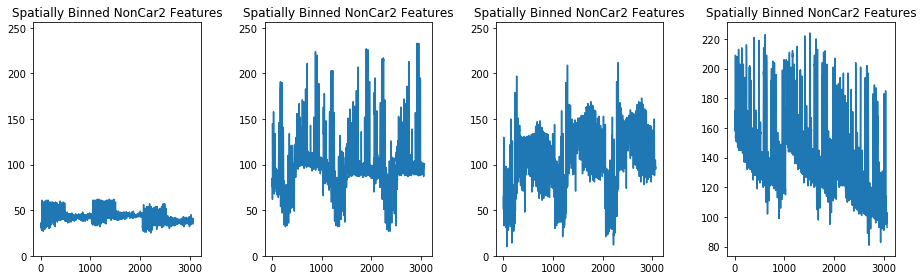

In [15]:
fig = plt.figure(figsize=(13,4))
plt.subplot(141)
plt.plot(bin_spatial(imgNoCars[random.randint(1, len(imgNoCars))]))
plt.title('Spatially Binned NonCar2 Features')
plt.ylim(0, 256)
plt.subplot(142)
plt.plot(bin_spatial(imgNoCars[random.randint(1, len(imgNoCars))]))
plt.title('Spatially Binned NonCar2 Features')
plt.ylim(0, 256)
plt.subplot(143)
plt.plot(bin_spatial(imgNoCars[random.randint(1, len(imgNoCars))]))
plt.title('Spatially Binned NonCar2 Features')
plt.ylim(0, 256)
plt.subplot(144)
plt.plot(bin_spatial(imgNoCars[random.randint(1, len(imgNoCars))]))
plt.title('Spatially Binned NonCar2 Features')
fig.tight_layout()

In [16]:
#fucntion to extract HOG, COlor and histogram features from image locations on disk
def extract_features(imgs, orient, pix_per_cell, cell_per_block, cspace='RGB', spatial_size=(32, 32),
                        hist_bins=32, hist_range=(0, 256), hog_channels = 3,  
                        vis1=False):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    c_space = 'RGB2' + cspace
    #print ('c space: ', c_space)
    colr_conv = 0
    binning_time = 0
    hog_time = 0
    histo_time = 0
    for img in imgs:
        
        # Read in each one by one
        image = mpimg.imread(img)
        t=time.time()
        image = convert_color(image, c_space)
        t2 = time.time()
        colr_conv = colr_conv + (t2-t)
        
        # Apply bin_spatial() to get spatial color features
        t3 = time.time()
        bin_features = bin_spatial(image)
        t4 = time.time()
        binning_time = binning_time + (t4-t3)
        # Apply color_hist() to get color histogram features
        t8 = time.time()
        hist_features = color_hist(image, nbins=32, bins_range=(0, 256))
        t9 = time.time()
        histo_time = histo_time+(t9 - t8)
        # Append the new feature vector to the features list
        
        #append hog features
        t5 = time.time()
        if 3 == hog_channels:
            #print ('hog_channels: ', hog_channels)
            hogF = []
            for i in range(3):
                hogF1 = get_hog_features(image[:,:,i], orient, pix_per_cell, cell_per_block, 
                        vis = False, feature_vec=True)
                hogF.append(hogF1)
            hog_features = np.ravel(hogF)
        
        elif hog_channels < 3:
            #print ('hog_channels less : ', hog_channels)
            hog_features = get_hog_features(image[:,:,hog_channels], orient, pix_per_cell, cell_per_block, 
                        vis= False, feature_vec=True)
        t6 = time.time()
        hog_time = hog_time + (t6 - t5)
        feats = np.concatenate((bin_features, hist_features, hog_features))
        
        features.append(feats)
    # Return list of feature vectors
    print ('colr_conv time = ', round(colr_conv,3), 'binning_time= ', round(binning_time,3), 'hog_time= ', round(hog_time,3), 'histo_time= ', round(histo_time,3))
    return features

### Data extracted is with: HOGs: Orient 16,  Pixels/Cell: 16, Cells/block : 2, Color features for (32,32)
### Color Space: YCrCb, all 3 channels. Backup2.ipynb generates the below .pkl files

In [17]:

# Load from file
with open('svc.pkl', 'rb') as file:  
    svc = pickle.load(file)
    
with open('mlp.pkl', 'rb') as file:  
    clf = pickle.load(file)
with open('forest.pkl', 'rb') as file:  
    clf1 = pickle.load(file)
    
with open('X_scaler.pkl', 'rb') as file:  
    X_scaler = pickle.load(file)


In [18]:
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    rectangles = []
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch3.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch3.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1,hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction1 = svc.predict(test_features)  
            test_prediction2 = clf.predict(test_features)
            test_prediction3 = clf.predict(test_features)
            
            if test_prediction1 == 1 and test_prediction2 ==1 and test_prediction3 ==1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                rectangles.append([(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)])
                
    return draw_img, rectangles

In [19]:
def find_cars1(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    rectangles = []
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch3.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch3.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1,hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction1 = svc.predict(test_features)  
            test_prediction2 = clf.predict(test_features)
            test_prediction3 = clf.predict(test_features)
            
            if test_prediction1 == 1 and test_prediction2 ==1 and test_prediction3 ==1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                #cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                rectangles.append([(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)])
                
    return  rectangles

### Try diffrent scale, virticle start and stop values for sliding windows

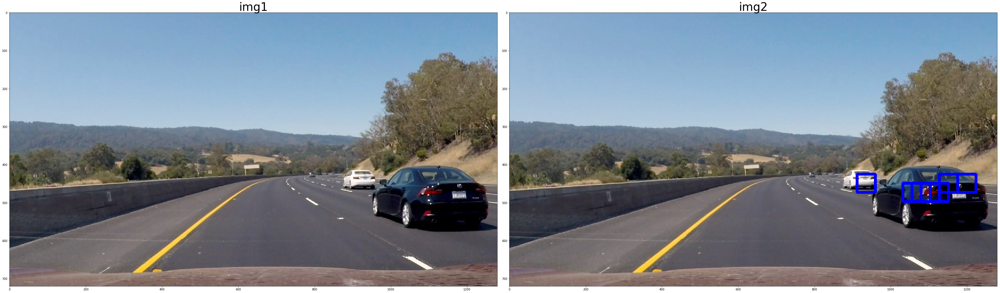

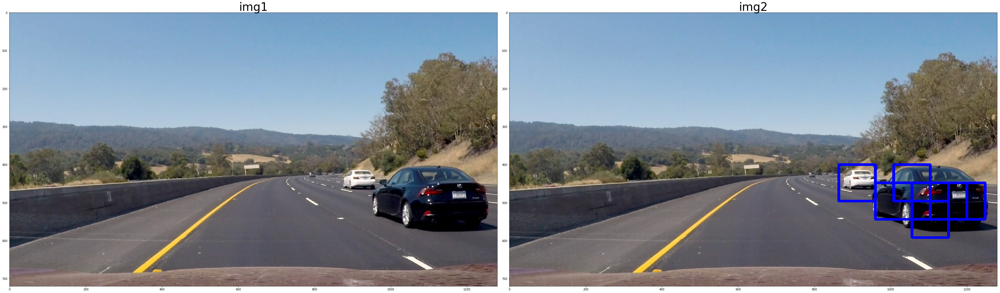

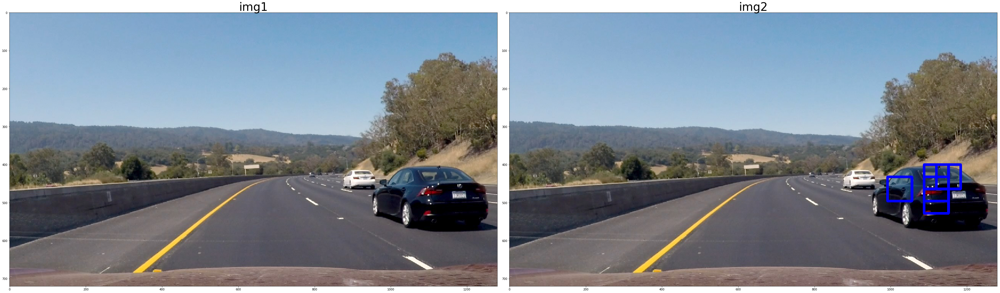

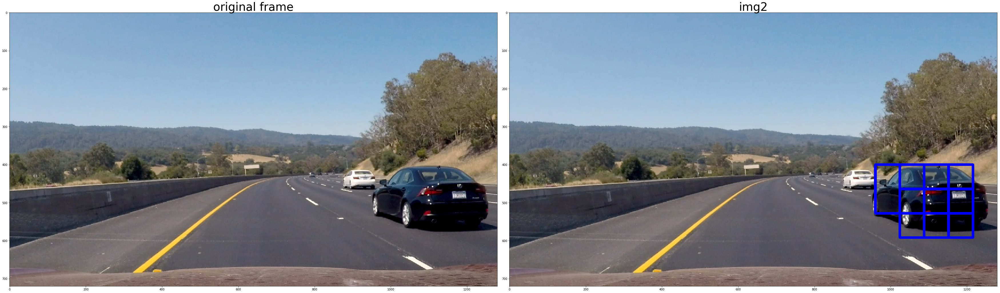

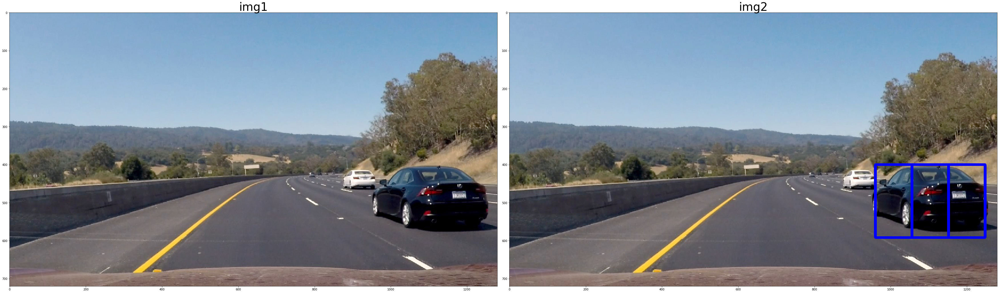

In [20]:
rects = []
image = mpimg.imread('test_images/test9.jpg')
image = exposure.adjust_gamma(image, 0.8)
orient = 16
pix_per_cell = 16
cell_per_block = 2

scale = 0.75
ystart = 425
ystop = 500
boxes, rectangles = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
rects.append(rectangles)

ystart = 400
ystop = 650
scale = 1.5
boxes, rectangles = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
rects.append(rectangles)

scale = 1.0
ystart = 400
ystop = 650
boxes, rectangles = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
rects.append(rectangles)



scale = 2
ystart = 400
ystop = 650
boxes, rectangles = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
compare_images(image, boxes, text1 = 'original frame', text2 = 'img2')
rects.append(rectangles)

scale = 3
ystart = 400
ystop = 400 + 3*65
boxes, rectangles = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
compare_images(image, boxes, text1 = 'img1', text2 = 'img2')
rects.append(rectangles)




In [21]:
# class to store rectangles from last 10 frames and privious labels
class Vehicle():
    def __init__(self):
        # privious labels
        self.prev_rects = np.zeros((720,1280))
        self.rects = []
    
    def add_rects(self, rects):
        #add rects after labels i.e. after threshhold (use if to reduce noise of next frame)
        self.prev_rects = rects
    #keep history of last 10frames (assuming in around 30fps video traffic won't substantiably chainge in 10 frames)
    def add_current_rects(self, rects):
        self.rects.append(rects)
        if len(self.rects) > 10:
            self.rects = self.rects[len(self.rects)-10:]

In [22]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
        
        
    # Return the image
    return img

In [23]:
r1 = Vehicle()

[[[[(912, 425), (960, 473)], [(1032, 449), (1080, 497)], [(1056, 449), (1104, 497)], [(1080, 449), (1128, 497)], [(1104, 449), (1152, 497)], [(1128, 425), (1176, 473)], [(1176, 425), (1224, 473)]], [[(864, 400), (960, 496)], [(960, 448), (1056, 544)], [(1008, 400), (1104, 496)], [(1056, 448), (1152, 544)], [(1056, 496), (1152, 592)], [(1104, 448), (1200, 544)], [(1152, 448), (1248, 544)]], [[(992, 432), (1056, 496)], [(1088, 400), (1152, 464)], [(1088, 432), (1152, 496)], [(1088, 464), (1152, 528)], [(1120, 400), (1184, 464)]], [[(960, 400), (1088, 528)], [(1024, 400), (1152, 528)], [(1024, 464), (1152, 592)], [(1088, 400), (1216, 528)], [(1088, 464), (1216, 592)]], [[(960, 400), (1152, 592)], [(1056, 400), (1248, 592)]]], [[[(912, 425), (960, 473)], [(1032, 449), (1080, 497)], [(1056, 449), (1104, 497)], [(1080, 449), (1128, 497)], [(1104, 449), (1152, 497)], [(1128, 425), (1176, 473)], [(1176, 425), (1224, 473)]], [[(864, 400), (960, 496)], [(960, 448), (1056, 544)], [(1008, 400), (1

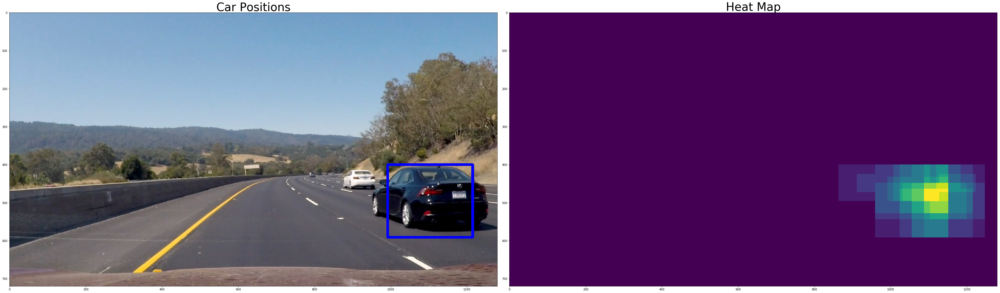

In [26]:
from scipy.ndimage.measurements import label

r1.add_current_rects(rects)
#print (r1.rects)
recs = []
print (r1.rects)
for rec in r1.rects:
    for i in rec:
        for j in i:
            #print (j)
            recs.append(j)
#print ("\n hola: ", (recs))


heat = np.zeros_like(image[:,:,1]).astype(np.float)

print ("heat", recs)
heat = add_heat(heat, recs)
heat1 = np.clip(heat, 0, 255)

pri_thresh_labels = label(heat1)
heatmap = apply_threshold(heat1, 3)
labels = label(heatmap)

#binarizing labels
binary_labels = np.where(labels[0]!=0, 1,0)
priv_binary_labeles = np.where(r1.prev_rects!=0, 1,0)
#bitwise anding the current and previous frames lables
x = (binary_labels&priv_binary_labeles)
#find labels again
l = label(x)
#add the current frames labels to buffer
r1.add_rects(labels[0])
#===============

draw_img = draw_labeled_bboxes(np.copy(image), l)


compare_images(draw_img, heat, text1 = 'Car Positions', text2 = 'Heat Map')

In [29]:
#heatmap = []
recF1 = Vehicle()
def process_image(image):
    rects = []
    #image = exposure.adjust_gamma(image, 0.8)
    image = cv2.resize(image, (1280, 720))

    scale = 0.75
    ystart = 390
    ystop = 425
    rectangles = find_cars1(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
    
    rects.append(rectangles)

    ystart = 400
    ystop = 650
    scale = 1.5
    rectangles = find_cars1(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
    
    rects.append(rectangles)

    scale = 1.0
    ystart = 400
    ystop = 650
    rectangles = find_cars1(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
    
    rects.append(rectangles)

    scale = 2
    ystart = 400
    ystop = 600
    rectangles = find_cars1(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
    
    rects.append(rectangles)

    scale = 3
    ystart = 400
    ystop = 400 + 3*65
    rectangles = find_cars1(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size = (32, 32), hist_bins=32)
    
    recF1.add_current_rects(rects)
    
    recs = []
    
    for rec in recF1.rects:
        for i in rec:
            for j in i:
                #print (j)
                recs.append(j)

    
    heat = np.zeros_like(image[:,:,1]).astype(np.float)
    heat = add_heat(heat, recs)
    #heat = np.clip(heat, 0, 255)

    heatmap = apply_threshold(heat, 4)
    labels = label(heatmap)

    binary_labels = np.where(labels[0]!=0, 1,0)
    priv_binary_labeles = np.where(recF1.prev_rects!=0, 1,0)
    x = (binary_labels&priv_binary_labeles)
    l = label(x)
    recF1.add_rects(labels[0])

    draw_img = draw_labeled_bboxes(np.copy(image), l)
    return draw_img
        
white_output = '1demo_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a 2 of the first 5 seconds test_video

clip2 = VideoFileClip("project_video.mp4").subclip(15, 18)
#clip2 = VideoFileClip("test_video.mp4")
white_clip = clip2.fl_image(process_image) #NOTE: this function expectscolor images!!
%time white_clip.write_videofile(white_output, audio=False)


[MoviePy] >>>> Building video 1demo_challenge_video.mp4
[MoviePy] Writing video 1demo_challenge_video.mp4


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 75/76 [01:07<00:00,  1.11it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: 1demo_challenge_video.mp4 

Wall time: 1min 8s
